In [44]:
%pip install pandas numpy seaborn


Note: you may need to restart the kernel to use updated packages.


In [45]:
import pandas as pd
import numpy as np
import seaborn as sns

In [46]:
houses = pd.read_csv('https://raw.githubusercontent.com/PaoloMissier/CSC3831-2021-22/main/IMPUTATION/TARGET-DATASETS/ORIGINAL/houses.csv', header=0)

In [47]:
houses.columns

Index(['median_house_value', 'median_income', 'housing_median_age',
       'total_rooms', 'total_bedrooms', 'population', 'households', 'latitude',
       'longitude'],
      dtype='object')

### plotting utility

In [48]:
## plotting utility

import matplotlib.pyplot as plt
from math import ceil

##
## type= {boxplot, kdeplot}
##
def plot_distributions(data, columns, type='boxplot', title=None):

    print("plotting columns {c}".format(c=list(columns)))
    
    if type not in {'boxplot', 'dkeplot'}:
        print("type= {boxplot, dkeplot} only are supported")
        return

    ## grid size depends on number of columns
    ## max 4 columns in the grid
    maxCols  = 4
    
    if len(columns) < 4:
        numCols = len(columns)
    else:
        numCols = maxCols
    numRows = ceil(len(columns) / 4)
    
    print("grid is {0}x{1}".format(numRows, numCols))

    fig, axs = plt.subplots(numRows, numCols)
    fig.suptitle(title)
    fig.set_figwidth(5*numCols)
    fig.set_figheight(3*numCols)
    fig.tight_layout(pad=5.0)

    print(axs)

#         handle special axes
    if numRows == 1 and numCols == 1:
        c = columns[0]
        # axes is a scalar
        if type == 'boxplot':
            sns.boxplot(data=data, x=c, ax=axs)
        else:
            sns.kdeplot(data=data, x=c, ax=axs)
        axs.set_title(c)

    elif numRows == 1:
        i = 0
        # axes is a 1D array
        for c in columns:
#         print("column {c}".format(c=c))
            if type == 'boxplot':
                sns.boxplot(data=data, x=c, ax=axs[i])
            else:
                sns.kdeplot(data=data, x=c, ax=axs[i])
            axs[i].set_title(c)
            i = i+1
        
    else:
    # general case of a 2D grid    
        i=j=0    
        for c in columns:
            print("column {c}".format(c=c))
            if type == 'boxplot':
                print("plotting on axes [{0},{1}]".format(i,j))
                sns.boxplot(data=data, x=c, ax=axs[i,j])
            else:
                sns.kdeplot(data=data, x=c, ax=axs[i,j])

            axs[i,j].set_title(c)
            j = j+1
            if j == 4:
                i = i+1
                j= 0


### Descriptive analytics: start by looking at raw statistics for the features in this dataset. what sort of story are they telling?

feel free to use the plot utility defined above

plotting columns ['median_house_value', 'median_income', 'housing_median_age', 'total_rooms', 'total_bedrooms', 'population', 'households', 'latitude', 'longitude']
grid is 3x4
[[<Axes: > <Axes: > <Axes: > <Axes: >]
 [<Axes: > <Axes: > <Axes: > <Axes: >]
 [<Axes: > <Axes: > <Axes: > <Axes: >]]
column median_house_value
plotting on axes [0,0]
column median_income
plotting on axes [0,1]
column housing_median_age
plotting on axes [0,2]
column total_rooms
plotting on axes [0,3]
column total_bedrooms
plotting on axes [1,0]
column population
plotting on axes [1,1]
column households
plotting on axes [1,2]
column latitude
plotting on axes [1,3]
column longitude
plotting on axes [2,0]


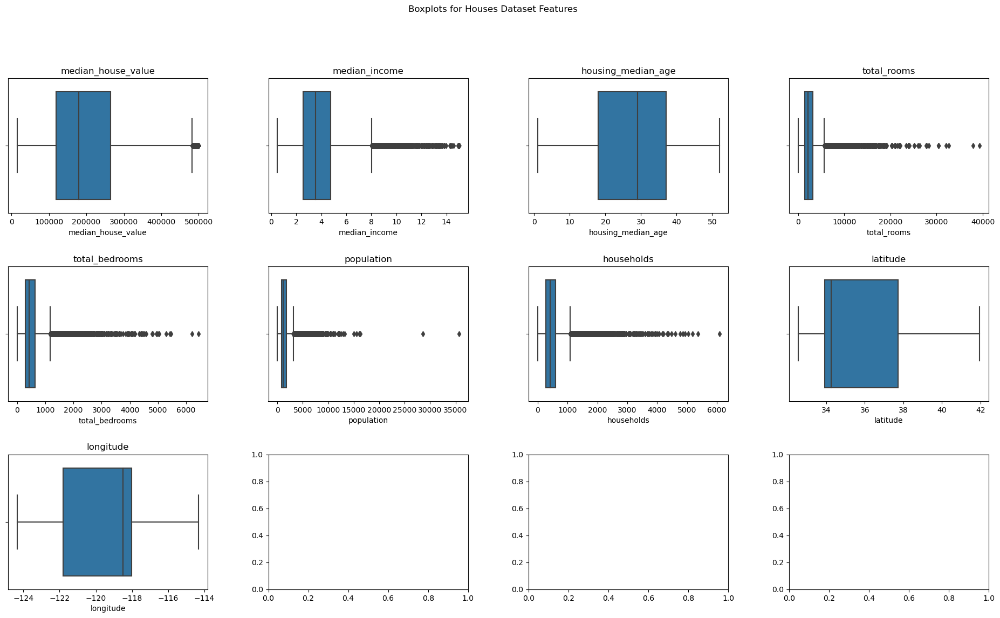

In [49]:
plot_distributions(houses, houses.columns, type='boxplot', title='Boxplots for Houses Dataset Features')

## EDA: Insights

- Median House Value: The median house value seems to be clustered around a central value, but has quite a wide spread aswell, with some outliers on the high end. So house values seem varied. 
- Median Income: For income, most households seem clustered on the low end, but there's a long tail stretching out to higher incomes, implying economic inequality.
- Housing Median Age: The age of housing seems varied - the plots range from new to old, leaning toward newer houses. 
- Total Rooms/ Total Bedrooms: Both total rooms and total bedrooms show clusters toward lower numbers, but also some houses packed with way more rooms and bedrooms than average. Makes me think there could be both typical family homes along with a few expensive and luxurious houses in the data.
- Population/ Households: Population and the number of households are a bit similar - it looks like some areas are packed densely with people and homes, but most areas are not. 
- Latitude/ Longitude: Latitude and longitude dont show any outliers and the locations seem clustered. This may mean this data comes from a defined geographic region rather than spanning uniformly across the country.

Overall, the houses dataset shows large variability in house value, income, and house-related features, i.e. age, rooms, bedrooms, population, and households. The presence of outliers in most features except for latitude and longitude suggests that there are some extreme values which might be interesting for further analysis, such as understanding why certain areas have significantly higher house values or why some blocks have such a high population. The outliers in many of these features could also indicate the presence of luxury properties, densely populated areas, or other unusual circumstances. It would be good to analyse these outliers in the context of the dataset to draw more precise conclusions.

In [50]:
%pip install folium

Note: you may need to restart the kernel to use updated packages.


In [51]:
import folium
import pandas as pd

houses = pd.read_csv('https://raw.githubusercontent.com/PaoloMissier/CSC3831-2021-22/main/IMPUTATION/TARGET-DATASETS/ORIGINAL/houses.csv', header=0)

latitude_mean = houses['latitude'].mean()
longitude_mean = houses['longitude'].mean()

houses_map = folium.Map(location=[latitude_mean, longitude_mean], zoom_start=5)

# add markers to houses_map
for index, row in houses.iterrows():
    folium.CircleMarker(location=[row['latitude'], row['longitude']],
                        radius=1,
                        color='blue',
                        fill=True,
                        fill_color='blue').add_to(houses_map)


houses_map

From the map above we can see that the houses dataset uses data from California. 

References for the map: 

- Sharma, A. (2020). Geospatial Analysis using Folium in Python | Work with Location Data. [online] Analytics Vidhya. Available at: https://www.analyticsvidhya.com/blog/2020/06/guide-geospatial-analysis-folium-python/.

- python-visualization.github.io. (n.d.). Folium — Folium 0.1.dev1+g57e8eae documentation. [online] Available at: https://python-visualization.github.io/folium/latest/.

- Connors, L. (2021). Creating a Simple Map with Folium and Python. [online] Medium. Available at: https://towardsdatascience.com/creating-a-simple-map-with-folium-and-python-4c083abfff94.

- pandas.pydata.org. (n.d.). pandas.DataFrame.iterrows — pandas 1.1.4 documentation. [online] Available at: https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.iterrows.html.

### feature normalisation 

Some of the features need to be normalised before any conclusion can be drawn

In [52]:
%pip install scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [53]:
from sklearn.preprocessing import RobustScaler
import pandas as pd

houses = pd.read_csv('https://raw.githubusercontent.com/PaoloMissier/CSC3831-2021-22/main/IMPUTATION/TARGET-DATASETS/ORIGINAL/houses.csv', header=0)

robust_scaler = RobustScaler()
houses_robust_scaled = robust_scaler.fit_transform(houses)
houses_robust_scaled_df = pd.DataFrame(houses_robust_scaled, columns=houses.columns)

# display the first few rows of the scaled dataframe
print(houses_robust_scaled_df.head())


   median_house_value  median_income  housing_median_age  total_rooms  \
0            1.880448       2.197582            0.631579    -0.733422   
1            1.232041       2.186664           -0.421053     2.924276   
2            1.187941       1.707732            1.210526    -0.388178   
3            1.113523       0.967177            1.210526    -0.501691   
4            1.119724       0.142854            1.210526    -0.294074   

   total_bedrooms  population  households  latitude  longitude  
0       -0.869318   -0.899787   -0.870769  0.957672  -0.986807  
1        1.906250    1.316631    2.243077  0.952381  -0.984169  
2       -0.696023   -0.714286   -0.713846  0.949735  -0.989446  
3       -0.568182   -0.648188   -0.584615  0.949735  -0.992084  
4       -0.440341   -0.640725   -0.461538  0.949735  -0.992084  


plotting columns ['median_house_value', 'median_income', 'housing_median_age', 'total_rooms', 'total_bedrooms', 'population', 'households', 'latitude', 'longitude']
grid is 3x4
[[<Axes: > <Axes: > <Axes: > <Axes: >]
 [<Axes: > <Axes: > <Axes: > <Axes: >]
 [<Axes: > <Axes: > <Axes: > <Axes: >]]
column median_house_value
plotting on axes [0,0]
column median_income
plotting on axes [0,1]
column housing_median_age
plotting on axes [0,2]
column total_rooms
plotting on axes [0,3]
column total_bedrooms
plotting on axes [1,0]
column population
plotting on axes [1,1]
column households
plotting on axes [1,2]
column latitude
plotting on axes [1,3]
column longitude
plotting on axes [2,0]
plotting columns ['total_rooms', 'total_bedrooms', 'population', 'households', 'median_income']
grid is 2x4
[[<Axes: > <Axes: > <Axes: > <Axes: >]
 [<Axes: > <Axes: > <Axes: > <Axes: >]]
column total_rooms
column total_bedrooms
column population
column households
column median_income
plotting columns ['total_rooms

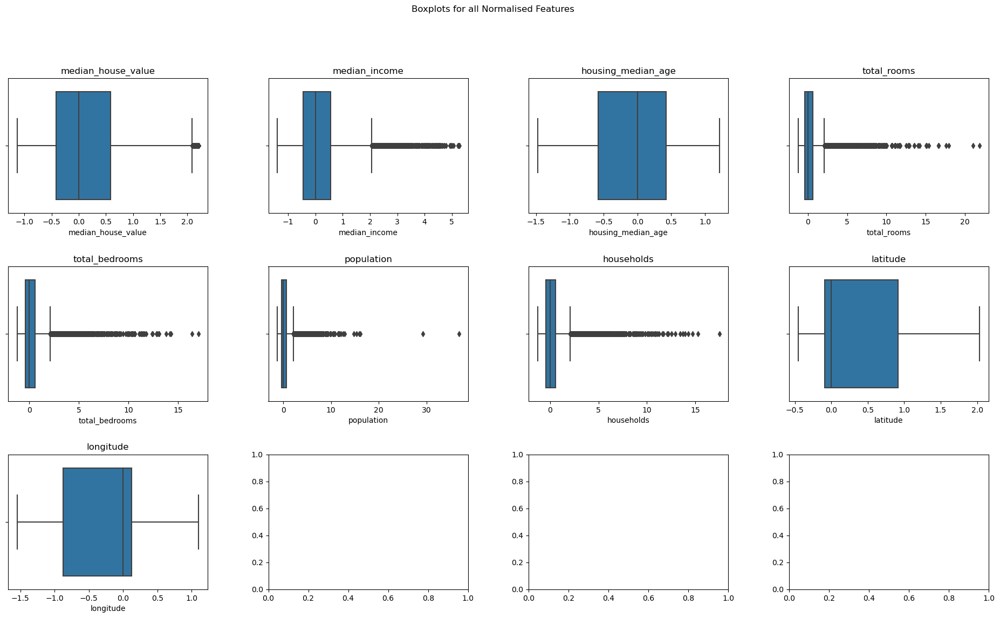

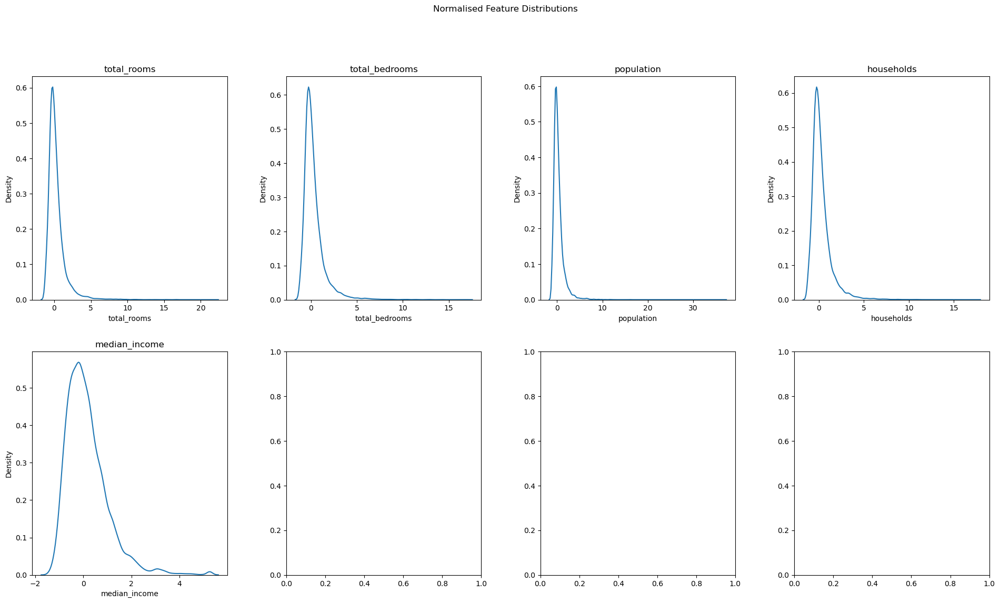

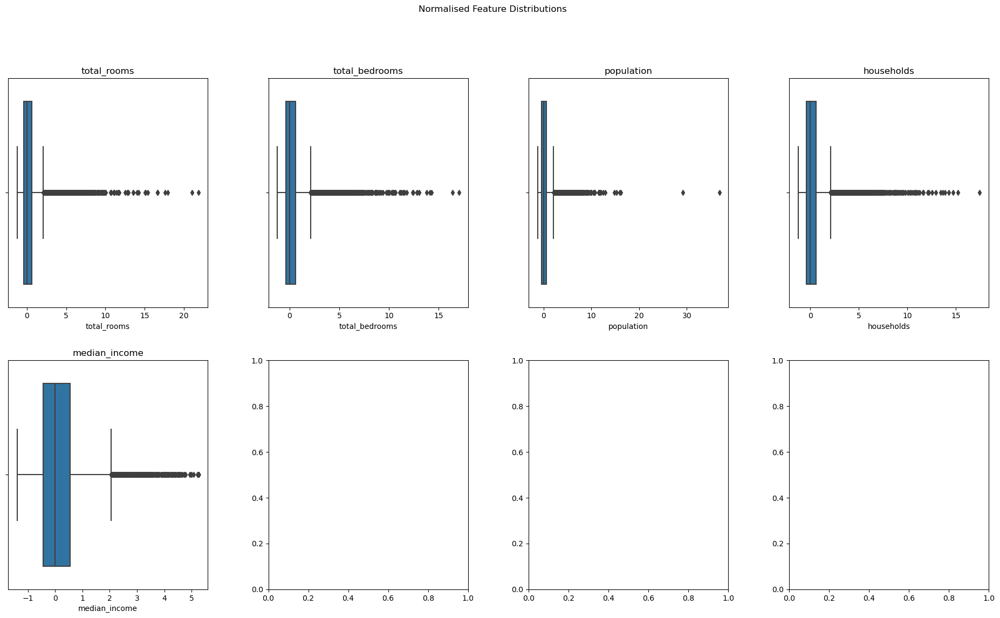

In [54]:
features = ['total_rooms', 'total_bedrooms', 'population', 'households', 'median_income'] # features w/ the most outliers

plot_distributions(houses_robust_scaled_df, houses_robust_scaled_df.columns, type='boxplot', title='Boxplots for all Normalised Features')
plot_distributions(houses_robust_scaled_df, features, type='dkeplot', title='Normalised Feature Distributions')
plot_distributions(houses_robust_scaled_df, features, type='boxplot', title='Normalised Feature Distributions')

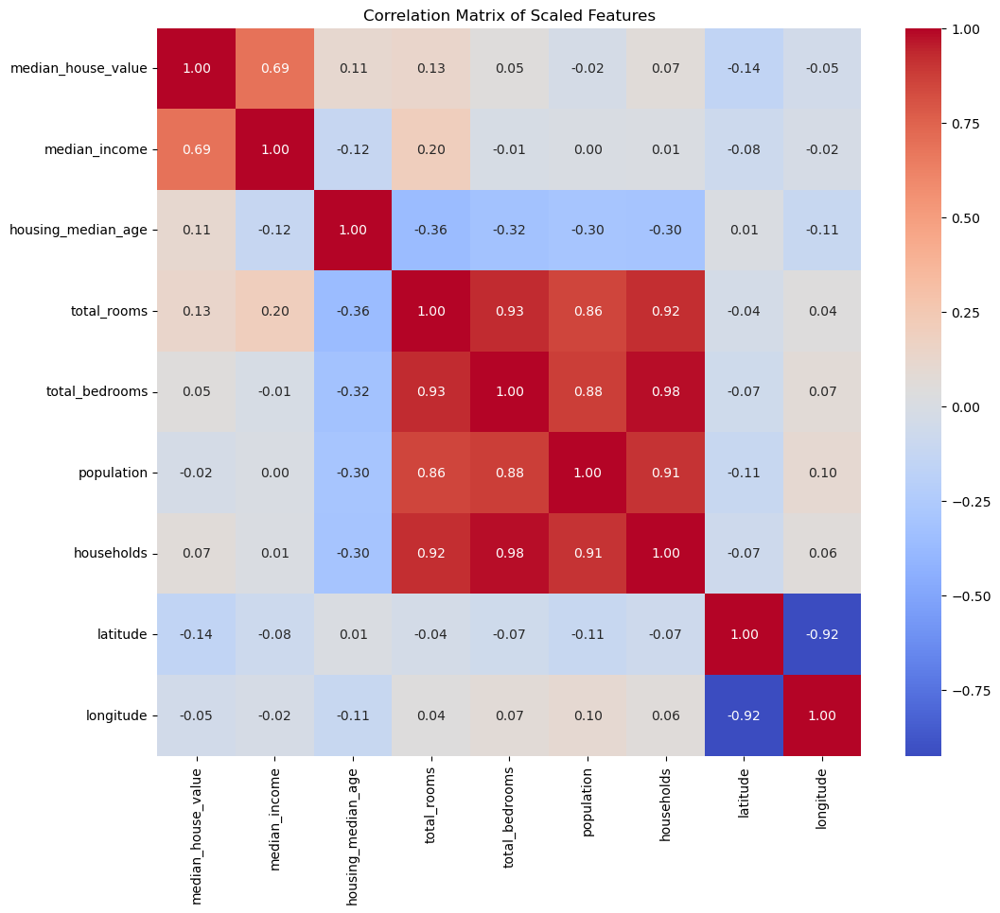

In [55]:
import seaborn as sns
import matplotlib.pyplot as plt

corr_matrix = houses_robust_scaled_df.corr()

# create a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)
plt.title("Correlation Matrix of Scaled Features")
plt.show()

References: 
- Brownlee, J. (2020). How to Scale Data With Outliers for Machine Learning. [online] Machine Learning Mastery. Available at: https://machinelearningmastery.com/robust-scaler-transforms-for-machine-learning/.
- Stack Overflow. (n.d.). python - Data Standardization vs Normalization vs Robust Scaler. [online] Available at: https://stackoverflow.com/questions/51841506/data-standardization-vs-normalization-vs-robust-scaler.
- Anon, (n.d.). Feature Scaling with scikit-learn – Ben Alex Keen. [online] Available at: https://benalexkeen.com/feature-scaling-with-scikit-learn/.
- Data Science Stack Exchange. (n.d.). Is standardization/normalization a good way of reducing the impact of outliers when I’m training a machine learning model? [online] Available at: https://datascience.stackexchange.com/questions/102625/is-standardization-normalization-a-good-way-of-reducing-the-impact-of-outliers-w.

- Used Robust Scaler as its less sensitive to outliers:
    - It subtracts the median from each data point.
    - It Divides by the interquartile range (IQR).

### What normalisation method did I use and why?

- Used Robust Scaler as its less sensitive to outliers.
- Direct Quote: 'When there are many instances of outliers in your dataset, you can normalize the data with the median divided by the IQR = the difference between the 75th and 25th percentiles of your data. This would not negate the effect of outliers in your machine learning model but will instead make normalize your data correctly, despite the existence of these extreme points.' [link](https://datascience.stackexchange.com/questions/102625/is-standardization-normalization-a-good-way-of-reducing-the-impact-of-outliers-w)

Wanted to check the different features correlations to each other, specifically median house value since I have to predict median house value later in the imputation section.

### Results from the heatmap:

- I will disregard the longitude and latitude when talking about the results as my focus is on other features correlation with median_house_value, as longitude and latitude correlations aren't useful for now.
- From the heat map it's evident that median_house_value has the highest positive correlation to median_income out of the features. The median_house_value however has a negative correlation to the population.
- This would make sense as it tends to be the case that densely packed areas don't necessarily mean there is a higher median house values, unless it's a big city. 
- Additionally, median_income is a great factor as the higher the average income of an area is the more expensive the houses will be as richer people tend to have more disposable income.
- Furthermore, the other indicators (i.e. such as housing_median_age, total_bedrooms, total_rooms, households) all have realtively low positve correlations in comparison to median_house_value. So, having more, for example: bedrooms, rooms, households or an older house, is not necessarily gonna mean the median_house_value will be higher.  


### record identification

based on analysis of the normalised features, try and pinpoint specific records that may be outliers, and explain why

If you look at the boxplots for all the normalised features then it becomes quite evident the features with a significant number of outliers:
- total_rooms
- total_bedrooms
- population
- households
- median_income
- (and some outliers in median_house_value)

These outliers could be coming from large, expensive and luxrious houses in the dataset as big and expensive houses tend to differ when it comes to i.e. no of rooms, bedrooms and median income in particular. Therefore these features listed above will be useful in helping to identify records which may be potential outliers. 


### Non Algorithmic Outlier Detection

A common rule: The outliers are those points whose z-score exceeds some fixed threshold.

Z-score information from these slides:

canvas.ncl.ac.uk. (n.d.). Newcastle University - Canvas Login. [online] Available at: https://ncl.instructure.com/courses/50010/pages/lecture-4-anomaly-detection-06-slash-10?module_item_id=2908306.


In [56]:
from scipy import stats

# References: 
# canvas.ncl.ac.uk. (n.d.). Newcastle University - Canvas Login. [online] Available at: https://ncl.instructure.com/courses/50010/pages/lecture-4-anomaly-detection-06-slash-10?module_item_id=2908306.
# Stack Overflow. (n.d.). Detect the ‘outliers’. [online] Available at: https://stackoverflow.com/questions/62366263/detect-the-outliers [Accessed 14 Dec. 2023].
# Srivastava, A. (2023). Detecting Anomalies with Z-Scores: A Practical Approach. [online] Medium. Available at: https://medium.com/@akashsri306/detecting-anomalies-with-z-scores-a-practical-approach-2f9a0f27458d [Accessed 14 Dec. 2023]. --> says you 3 is a good threshold to use for z-score

# calculate the z-score
z_scores = np.abs(stats.zscore(houses_robust_scaled_df))
threshold = 3
position_outlier = np.where(z_scores > threshold) 

outlier_index = houses_robust_scaled_df.iloc[position_outlier[0]].index.tolist() # get indices of outliers
unique_outliers_index = list(set(outlier_index)) # get unique indices

total_unique_outliers = len(unique_outliers_index)
print("Total no. of unique outliers for z-score:", total_unique_outliers)
print("Z-score unique outliers indices:", unique_outliers_index) # avoids double counting -> that's why unique outliers need to be used


Total no. of unique outliers for z-score: 892
Z-score unique outliers indices: [4111, 12305, 4116, 12318, 18462, 12325, 18469, 12329, 20529, 20530, 12340, 12342, 12346, 12347, 6204, 12351, 20543, 20544, 12354, 10309, 12358, 2119, 10312, 18501, 12362, 18504, 18505, 10317, 10318, 10319, 12365, 6226, 12371, 10324, 20563, 10326, 12374, 12375, 12376, 12377, 10332, 12382, 95, 12383, 12385, 12386, 104, 12395, 12402, 116, 8309, 12406, 8311, 10362, 12411, 4220, 14459, 131, 14467, 4229, 12422, 14469, 4232, 10376, 14471, 12430, 6287, 18346, 6289, 14482, 10389, 14486, 18347, 20629, 6297, 6298, 12441, 14491, 4253, 18348, 6303, 18349, 4257, 10401, 10402, 2213, 4262, 10405, 4264, 14505, 4266, 4267, 18351, 18352, 16559, 10417, 14515, 18353, 6328, 6329, 18354, 18619, 18355, 6338, 18356, 6340, 14543, 14553, 10458, 14558, 4319, 10464, 16606, 10472, 10483, 10484, 6389, 2294, 6391, 4345, 6399, 4352, 6401, 2311, 2312, 8467, 8468, 10517, 10519, 283, 16669, 10527, 20412, 10539, 18745, 10562, 16711, 8520, 1057

In [57]:
zscore_cleaned = houses_robust_scaled_df.drop(index=unique_outliers_index)

"""
1) median_income
2) total_rooms
3) total_bedrooms
4) population
5) households
"""

# before outliers removed
corr_1_before_zscore = houses_robust_scaled_df['median_house_value'].corr(houses_robust_scaled_df['median_income'])
corr_2_before_zscore = houses_robust_scaled_df['median_house_value'].corr(houses_robust_scaled_df['total_rooms'])
corr_3_before_zscore = houses_robust_scaled_df['median_house_value'].corr(houses_robust_scaled_df['total_bedrooms'])
corr_4_before_zscore = houses_robust_scaled_df['median_house_value'].corr(houses_robust_scaled_df['population'])
corr_5_before_zscore = houses_robust_scaled_df['median_house_value'].corr(houses_robust_scaled_df['households'])

print("1) Correlation before removing outliers:", corr_1_before_zscore)
print("2) Correlation before removing outliers:", corr_2_before_zscore)
print("3) Correlation before removing outliers:", corr_3_before_zscore)
print("4) Correlation before removing outliers:", corr_4_before_zscore)
print("5) Correlation before removing outliers:", corr_5_before_zscore)

# after outliers removed
corr_1_after_zscore = zscore_cleaned['median_house_value'].corr(zscore_cleaned['median_income'])
corr_2_after_zscore = zscore_cleaned['median_house_value'].corr(zscore_cleaned['total_rooms'])
corr_3_after_zscore = zscore_cleaned['median_house_value'].corr(zscore_cleaned['total_bedrooms'])
corr_4_after_zscore = zscore_cleaned['median_house_value'].corr(zscore_cleaned['population'])
corr_5_after_zscore = zscore_cleaned['median_house_value'].corr(zscore_cleaned['households'])

print("\n")
print("1) Correlation after removing outliers:", corr_1_after_zscore)
print("2) Correlation after removing outliers:", corr_2_after_zscore)
print("3) Correlation after removing outliers:", corr_3_after_zscore)
print("4) Correlation after removing outliers:", corr_4_after_zscore)
print("5) Correlation after removing outliers:", corr_5_after_zscore)


1) Correlation before removing outliers: 0.6880752079585482
2) Correlation before removing outliers: 0.13415311380656306
3) Correlation before removing outliers: 0.0505937888120664
4) Correlation before removing outliers: -0.024649678888894896
5) Correlation before removing outliers: 0.06584265057005642


1) Correlation after removing outliers: 0.6571088758446595
2) Correlation after removing outliers: 0.17132249777508515
3) Correlation after removing outliers: 0.07652871142525675
4) Correlation after removing outliers: -0.034091038491046194
5) Correlation after removing outliers: 0.0952699838851672


Modified z-score

In [58]:
import numpy as np

# References: 
# Stack Overflow. (n.d.). Median absolute deviation from numpy ndarray. [online] Available at: https://stackoverflow.com/questions/63991322/median-absolute-deviation-from-numpy-ndarray [Accessed 14 Dec. 2023].
# Zach (2021). What is a Modified Z-Score? (Definition & Example). [online] Statology. Available at: https://www.statology.org/modified-z-score/. --> says that 3.5 is a good threshold for modified z-score
# www.w3schools.com. (n.d.). Python List extend() Method. [online] Available at: https://www.w3schools.com/python/ref_list_extend.asp.

# function to calculate MAD
def mad(house_values):
    return np.median(np.abs(house_values - np.median(house_values)))

all_outliers_index = []

for feature in houses_robust_scaled_df.columns:
    median_of_feature = np.median(houses_robust_scaled_df[feature])
    mad_of_feature = mad(houses_robust_scaled_df[feature])

    # calculate the modified z-score
    modified_z_score = 0.6745 * (houses_robust_scaled_df[feature] - median_of_feature) / mad_of_feature
    threshold = 3.5 
    feature_outliers = houses_robust_scaled_df.index[modified_z_score.abs() > threshold].tolist()
    
    print(f"Outliers of {feature} using modified z-scores: {feature_outliers}")
    all_outliers_index.extend(feature_outliers)


modified_z_unique_outliers_index = list(set(all_outliers_index))
total_unique_outliers = len(modified_z_unique_outliers_index)
print(f" Modified z-score unique outlier indices: {modified_z_unique_outliers_index}") # avoids double counting -> that's why unique outliers need to be used
print(f"Total no. of unique outliers for modified z-score: {total_unique_outliers}")

Outliers of median_house_value using modified z-scores: []
Outliers of median_income using modified z-scores: [131, 409, 494, 510, 511, 512, 514, 923, 977, 986, 996, 1541, 1561, 1563, 1564, 1566, 1574, 1582, 1583, 1585, 1586, 1589, 1591, 1593, 1602, 1617, 1621, 1636, 1637, 1644, 1645, 1646, 2213, 2826, 2969, 3472, 3486, 3533, 3542, 3858, 3953, 4014, 4018, 4042, 4044, 4045, 4046, 4047, 4048, 4049, 4050, 4056, 4070, 4074, 4111, 4116, 4220, 4229, 4319, 4345, 4352, 4353, 4492, 4604, 4605, 4606, 4622, 4626, 4677, 4678, 5242, 5243, 5244, 5246, 5247, 5248, 5250, 5252, 5253, 5254, 5256, 5257, 5258, 5259, 5260, 5264, 5269, 5271, 5272, 5273, 5275, 5277, 5279, 5280, 5281, 5291, 5292, 5304, 5305, 5318, 5351, 5352, 5360, 5361, 5368, 5493, 5494, 5728, 5738, 6073, 6204, 6226, 6374, 6389, 6391, 6399, 6551, 6556, 6576, 6585, 6590, 6591, 6592, 6593, 6594, 6712, 6720, 6724, 6725, 6726, 6727, 6728, 6729, 6731, 6732, 6735, 6736, 6915, 6918, 6919, 8311, 8578, 8632, 8768, 8790, 8792, 8793, 8794, 8795, 8796, 

In [59]:
modified_zscore_cleaned = houses_robust_scaled_df.drop(index=modified_z_unique_outliers_index)

"""
1) median_income
2) total_rooms
3) total_bedrooms
4) population
5) households
"""

# before outliers removed
corr_1_before_zscore = houses_robust_scaled_df['median_house_value'].corr(houses_robust_scaled_df['median_income'])
corr_2_before_zscore = houses_robust_scaled_df['median_house_value'].corr(houses_robust_scaled_df['total_rooms'])
corr_3_before_zscore = houses_robust_scaled_df['median_house_value'].corr(houses_robust_scaled_df['total_bedrooms'])
corr_4_before_zscore = houses_robust_scaled_df['median_house_value'].corr(houses_robust_scaled_df['population'])
corr_5_before_zscore = houses_robust_scaled_df['median_house_value'].corr(houses_robust_scaled_df['households'])

print("1) Correlation before removing outliers:", corr_1_before_zscore)
print("2) Correlation before removing outliers:", corr_2_before_zscore)
print("3) Correlation before removing outliers:", corr_3_before_zscore)
print("4) Correlation before removing outliers:", corr_4_before_zscore)
print("5) Correlation before removing outliers:", corr_5_before_zscore)


# after outliers removed
corr_1_after_modified_zscore = modified_zscore_cleaned['median_house_value'].corr(modified_zscore_cleaned['median_income'])
corr_2_after_modified_zscore = modified_zscore_cleaned['median_house_value'].corr(modified_zscore_cleaned['total_rooms'])
corr_3_after_modified_zscore = modified_zscore_cleaned['median_house_value'].corr(modified_zscore_cleaned['total_bedrooms'])
corr_4_after_modified_zscore = modified_zscore_cleaned['median_house_value'].corr(modified_zscore_cleaned['population'])
corr_5_after_modified_zscore = modified_zscore_cleaned['median_house_value'].corr(modified_zscore_cleaned['households'])

print("\n")
print("1) Correlation after removing outliers:", corr_1_after_modified_zscore)
print("2) Correlation after removing outliers:", corr_2_after_modified_zscore)
print("3) Correlation after removing outliers:", corr_3_after_modified_zscore)
print("4) Correlation after removing outliers:", corr_4_after_modified_zscore)
print("5) Correlation after removing outliers:", corr_5_after_modified_zscore)

1) Correlation before removing outliers: 0.6880752079585482
2) Correlation before removing outliers: 0.13415311380656306
3) Correlation before removing outliers: 0.0505937888120664
4) Correlation before removing outliers: -0.024649678888894896
5) Correlation before removing outliers: 0.06584265057005642


1) Correlation after removing outliers: 0.6504253005565848
2) Correlation after removing outliers: 0.18483549047507267
3) Correlation after removing outliers: 0.0756405152358273
4) Correlation after removing outliers: -0.054950662892361765
5) Correlation after removing outliers: 0.09511600186580405


### Modified z-score:

I was initially going to do the z-score method but after doing research I found that the modified z-score method is considered more optimal for datasets with outliers as its more robust to outliers.

References:
- Rousseeuw, P.J. and Hubert, M. (2011). Robust statistics for outlier detection. Wiley Interdisciplinary Reviews: Data Mining and Knowledge Discovery, 1(1), pp.73–79. doi:https://doi.org/10.1002/widm.2.
- canvas.ncl.ac.uk. (n.d.). Newcastle University - Canvas Login. [online] Available at: https://ncl.instructure.com/courses/50010/pages/lecture-4-anomaly-detection-06-slash-10?module_item_id=2908306.
- www.itl.nist.gov. (n.d.). 1.3.5.17. Detection of Outliers. [online] Available at: https://www.itl.nist.gov/div898/handbook/eda/section3/eda35h.htm#:~:text=These%20authors%20recommend%20that%20modified. --> tells me about modified z-score and is the reason I used 0.6745 in modified z-score
- jain, V. (2020). Anomaly detection by Modified Z-Score. [online] Analytics Vidhya. Available at: https://medium.com/analytics-vidhya/anomaly-detection-by-modified-z-score-f8ad6be62bac.

This is because the modified z-score method uses median and MAD which are more robust than mean and standard deviation which is what the normal z-score method uses. Making the modified z-score method better suited for the non algorithmic outlier detection.

The reason median is better than the mean is because it gives a central region of the data therefore it's not being impacted by outliers.  The MAD is simply just the median of all absolute deviations from the median, increasing its robustness and reliability in comparison to the standard deviation, when it comes to estimating variability of data.

have you completely solved the problem? how do we know for sure?

we may have removed too much (FP) or too little (FN). Can you suggest empirical validation of your findings?

### Analysis of Correlation Changes for modified z-score:

Median Income / Median House Value:
- Before: 0.688
- After: 0.650
- The correlation decreased a bit from 0.688 to 0.650 after removing outliers with the modified z-score method. This suggests that some extreme values might have been influencing the positive relationship between income and home values. Regardless, the correlation still remains strong, showing median income level could reliably predict median house prices.

Total Rooms / Median House Value:
- Before: 0.134
- After: 0.185
- The correlation strengthened from 0.134 to 0.185 after removing outliers. It seems removing anomalous data shows a clearer positive link between number of rooms and median house value.

Total Bedrooms / Median House Value:
- Before: 0.051
- After: 0.076
- The positive correlation increased from 0.051 to 0.076 after the outliers were removed. Implying that removing outliers shows better correlation between no. of bedrooms and median house value that was unclear before, still the correlation is not that high.

Population / Median House Value:
- Before: -0.025
- After: -0.055
- The negative correlation, while still small, did get slightly stronger negative correlation after removing outliers, going from -0.025 to -0.055. Therefore, a couple extreme points may have been making the negative correlation subtle between population and median house value.

Households / Median House Value:
- Before: 0.066
- After: 0.095
- Like with total rooms and bedrooms, the positive correlation increased after outlier removal, rising from 0.066 to 0.095. 

Overall, it looks like taking anomalies (outliers) into account allowed the discovery of a more nuanced positive correlations between number of households, total rooms, total bedrooms, and median house value.

## next, try using LOF and / or KNN and see if the results align with your empirical analysis

from sklearn.neighbors import LocalOutlierFactor

In [60]:
import pandas as pd

houses = pd.read_csv('https://raw.githubusercontent.com/PaoloMissier/CSC3831-2021-22/main/IMPUTATION/TARGET-DATASETS/ORIGINAL/houses.csv', header=0)
total_num = len(houses)

print("Total no. of data points:", total_num)

Total no. of data points: 20640


In [61]:
from sklearn.neighbors import LocalOutlierFactor, NearestNeighbors
import numpy as np

# References:
# scikit-learn.org. (n.d.). sklearn.neighbors.NearestNeighbors — scikit-learn 0.24.1 documentation. [online] Available at: https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.NearestNeighbors.html.
# scikit-learn. (n.d.). sklearn.neighbors.LocalOutlierFactor. [online] Available at: https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.LocalOutlierFactor.html#sklearn.neighbors.LocalOutlierFactor
# canvas.ncl.ac.uk. (n.d.). Newcastle University - Canvas Login. [online] Available at: https://ncl.instructure.com/courses/50010/pages/lecture-4-anomaly-detection-06-slash-10?module_item_id=2908306. --> From the K-NN Global Anomaly Detection it says the k value, i.e. n_neighbors, should be from 10<k<50.

nn = NearestNeighbors(n_neighbors=25)
nn.fit(houses_robust_scaled_df)
distances, indices = nn.kneighbors(houses_robust_scaled_df)

lof = LocalOutlierFactor(n_neighbors=25)
lof_outliers = lof.fit_predict(houses_robust_scaled_df)
lof_outliers_index = np.where(lof_outliers == -1)[0]

# define a threshold for distance to consider a point as an outlier
distance_threshold = 1
nn_outliers = np.where(distances[:, 1] > distance_threshold)[0]

total_nn_outliers = len(nn_outliers)
total_lof_outliers = len(lof_outliers_index)

print("Total no. of outliers detected by NearestNeighbors:", total_nn_outliers)
print("Total no. of outliers detected by Local Outlier Factor:", total_lof_outliers)

Total no. of outliers detected by NearestNeighbors: 317
Total no. of outliers detected by Local Outlier Factor: 194


- I chose the distance threshold for Nearest Neighbor through trial and error as a distance threshold greater than 1 finds a very small number of outliers in comparison to other methods. And if you look at the boxplots above it seems that there's more than just a few outliers. i.e. if you make the nearest neighbor distance threshold 2 then it detects only 40 outliers.

- I picked a k value, i.e. n_neighbors, of 25 for both the Nearest Neighbor and LOF as from the slides it said we could pick a k value from 10<k<50. [link](https://ncl.instructure.com/courses/50010/pages/lecture-4-anomaly-detection-06-slash-10?module_item_id=2908306)

## Your overall conclusions here

### Results:
    
Non Algorithmic Results:
   - z-score -> Total no. of unique outliers for z-score: 892
   - modified z-score -> Total no. of unique outliers for modified z-score: 2049
    
    
Algorithmic Results:
   - Nearest Neighbor -> Total no. of outliers detected by NearestNeighbors: 317 
   - LOF -> Total no. of outliers detected by Local Outlier Factor: 194
 
(Total no. of data points: 20640)

### Non Algorithmic Methods:

- The non algorithmic methods, i.e. modified z-score, found alot more outliers than the algorithmic methods. Showing high sensitivity when detecting outliers.

- However, with a large dataset, it might be the case that it's labeling normal variation as outliers. If too much gets called an outlier, the term loses its meaning.


### Algorithmic Methods:

- The algorithm-based techniques found less outliers. With LOF finding the least and Nearest Neighbor finding a little bit more, these methods account for the data structure as a whole.

- They possibly strike a better balance between finding true anomalies and reducing the number of false anomalies detected. However, it takes more computational power to use these methods. 


### Summary:

- For a big dataset like this one, the algorithmic methods seems more appropriate as they account for anomalies that can pop up randomly while not labelling too many data points as outliers. Their complexity is beneficial as it is less likely to overlabel datapoints as outliers.
